# Révolut project (fraud detection)

#### 1. IMPORT

In [1]:
import warnings


In [2]:
import numpy as np
import pandas as pd
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm import tqdm

In [3]:
import plotly.express as px
import plotly.graph_objects as go

In [4]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.metrics import (
    roc_auc_score,
    precision_recall_curve,
    auc,
    f1_score,
    confusion_matrix
)

In [5]:
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import (
    RandomForestClassifier,
    IsolationForest,
    StackingClassifier
)
from sklearn.tree import DecisionTreeClassifier
from sklearn.calibration import CalibratedClassifierCV

In [6]:
warnings.filterwarnings('ignore')

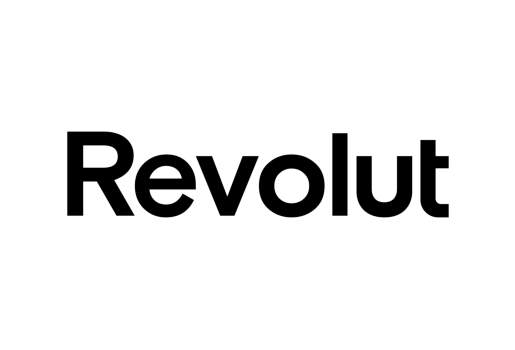

In [7]:
img = mpimg.imread('image.png')
plt.imshow(img)
plt.axis('off') 
plt.show()

### We'll load three datasets retrieved by Kaggle:
##### 1 - Users, containing basic information about customers
##### 2 - Fraudsters, containing the user IDs of customers who committed fraud
##### 3 - Transactions, containing all transaction data

In [8]:
users = pd.read_csv('data/users.csv')
fraudsters = pd.read_csv('data/fraudsters.csv')
transactions = pd.read_csv('data/transactions.csv')

In [9]:
users.head()

,ID,CREATED_DATE,COUNTRY,BIRTH_DATE
0,46f44852-aaa5-4634-aadd-8cc4eefef3c8,2019-04-22 18:30:30.735,BG,1984-10-22
1,f17dd8af-2edb-4415-a950-d90a1b5e3e5b,2019-04-15 02:44:24.94,IE,1984-11-04
2,55e6fcef-f573-4c54-8b27-537adc417e19,2019-04-03 16:10:44.53,PL,1977-09-08
3,dc03019c-9cf1-4081-a70a-6922a44fe393,2019-04-13 14:16:11.928,FR,1992-09-06
4,bcd967e5-c273-45a7-a7f5-e7c9e3b19b7e,2019-04-03 15:46:43.997,IE,1993-10-22


In [10]:
users.describe()

,ID,CREATED_DATE,COUNTRY,BIRTH_DATE
count,200250,200250,200250,200250
unique,200250,200240,57,19551
top,46f44852-aaa5-4634-aadd-8cc4eefef3c8,2019-04-27 09:51:17.386,GB,2001-04-17
freq,1,2,50980,81


In [11]:
users.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 200250 entries, 0 to 200249
Data columns (total 4 columns):
 #   Column        Non-Null Count   Dtype 
---  ------        --------------   ----- 
 0   ID            200250 non-null  object
 1   CREATED_DATE  200250 non-null  object
 2   COUNTRY       200250 non-null  object
 3   BIRTH_DATE    200250 non-null  object
dtypes: object(4)
memory usage: 6.1+ MB


Then here we can see that we have 200.250 users

In [12]:
users.isnull().mean()

ID              0.0
CREATED_DATE    0.0
COUNTRY         0.0
BIRTH_DATE      0.0
dtype: float64

In [13]:
fraudsters.head()

,USER_ID
0,2c831c76-2d62-41ce-a240-e12f505d389a
1,ce2a1146-831e-49a7-aa5f-a3045a2892af
2,447abe11-f89a-4819-bea2-e7978b1cf560
3,3a186446-c2fb-474b-a8d8-db362643b3d2
4,73fa6100-f6f0-4e22-b247-714f4743c125


In [14]:
fraudsters.describe()

,USER_ID
count,757
unique,757
top,2c831c76-2d62-41ce-a240-e12f505d389a
freq,1


And here can just see that we have 757 users who are fraudres

In [15]:
fraudsters.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 757 entries, 0 to 756
Data columns (total 1 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   USER_ID  757 non-null    object
dtypes: object(1)
memory usage: 6.0+ KB


In [16]:
fraudsters.isnull().mean()

USER_ID    0.0
dtype: float64

In [17]:
users['is_fraud'] = users['ID'].isin(fraudsters['USER_ID']).astype(int)

In [18]:
users.head()

,ID,CREATED_DATE,COUNTRY,BIRTH_DATE,is_fraud
0,46f44852-aaa5-4634-aadd-8cc4eefef3c8,2019-04-22 18:30:30.735,BG,1984-10-22,0
1,f17dd8af-2edb-4415-a950-d90a1b5e3e5b,2019-04-15 02:44:24.94,IE,1984-11-04,0
2,55e6fcef-f573-4c54-8b27-537adc417e19,2019-04-03 16:10:44.53,PL,1977-09-08,0
3,dc03019c-9cf1-4081-a70a-6922a44fe393,2019-04-13 14:16:11.928,FR,1992-09-06,0
4,bcd967e5-c273-45a7-a7f5-e7c9e3b19b7e,2019-04-03 15:46:43.997,IE,1993-10-22,0


In [19]:
transactions.head()

,ID,USER_ID,CREATED_DATE,TYPE,STATE,AMOUNT_GBP,CURRENCY
0,f659b44e-cfdf-48de-bcf3-06f47ef26e9f,fd7f3ff6-0ed6-4a85-a7b5-2f205e0ef72f,2019-04-20 18:04:03.93,CARD_PAYMENT,COMPLETED,13.12,PLN
1,2ae18b8b-b9bc-4c44-96b1-d43efd8d371d,3979518e-95f7-4b6c-81ae-2f828727d81a,2019-05-03 13:09:57.625,TOPUP,REVERTED,0.01,RON
2,0162d352-dd18-40ab-b3ee-cf6584c9a238,75aa5388-9c89-4f72-bc54-67501519585b,2019-04-25 15:37:46.837,TOPUP,COMPLETED,10.00,GBP
3,a4e176f7-49ca-462b-9164-2f0645622148,45598164-6362-4ee4-bd70-ffee3bd1d707,2019-04-28 13:52:15.256,EXCHANGE,COMPLETED,0.11,RON
4,f6f9135f-fb2b-4a58-bb65-dd9713306a71,5a501ce5-f03c-410d-aabc-434b2cad741d,2019-05-13 16:02:12.081,CARD_PAYMENT,COMPLETED,9.79,EUR


In [20]:
transactions.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1068361 entries, 0 to 1068360
Data columns (total 7 columns):
 #   Column        Non-Null Count    Dtype  
---  ------        --------------    -----  
 0   ID            1068361 non-null  object 
 1   USER_ID       1068361 non-null  object 
 2   CREATED_DATE  1068361 non-null  object 
 3   TYPE          1068361 non-null  object 
 4   STATE         1068361 non-null  object 
 5   AMOUNT_GBP    1068361 non-null  float64
 6   CURRENCY      1068361 non-null  object 
dtypes: float64(1), object(6)
memory usage: 57.1+ MB


1.068.361 of transactions in the dataset

In [21]:
transactions.describe()

,AMOUNT_GBP
count,1.068361e+06
mean,3.408766e+01
std,2.350485e+02
min,1.000000e-02
25%,1.000000e-02
50%,8.370000e+00
75%,1.702000e+01
max,8.325073e+04


In [22]:
df = transactions.merge(users, left_on='USER_ID', right_on='ID', how='left')
df.drop(columns=['ID_y'], axis=1, inplace=True)

In [23]:
df = df.rename(columns={'ID_x': 'Transaction_ID', 'CREATED_DATE_x': 'TRANSACTION_CREATED_DATE', 'CREATED_DATE_y': 'USER_CREATED_DATE'})

In [24]:
# Convert date columns to datetime, coercing errors to NaT (Not a Time)
df['TRANSACTION_CREATED_DATE'] = pd.to_datetime(df['TRANSACTION_CREATED_DATE'], errors='coerce')
df['USER_CREATED_DATE'] = pd.to_datetime(df['USER_CREATED_DATE'], errors='coerce')
df['BIRTH_DATE'] = pd.to_datetime(df['BIRTH_DATE'], errors='coerce')

In [25]:
# Convert datetime columns to date only (removes time information)
# This can be useful for features that only require the date part,
# such as calculating account age or grouping by day.
df['USER_CREATED_DATE'] = df['USER_CREATED_DATE'].dt.date
df['TRANSACTION_CREATED_DATE'] = df['TRANSACTION_CREATED_DATE'].dt.date
df['BIRTH_DATE'] = df['BIRTH_DATE'].dt.date

In [26]:
df.head()

,Transaction_ID,USER_ID,TRANSACTION_CREATED_DATE,TYPE,STATE,AMOUNT_GBP,CURRENCY,USER_CREATED_DATE,COUNTRY,BIRTH_DATE,is_fraud
0,f659b44e-cfdf-48de-bcf3-06f47ef26e9f,fd7f3ff6-0ed6-4a85-a7b5-2f205e0ef72f,2019-04-20,CARD_PAYMENT,COMPLETED,13.12,PLN,2019-04-18,PL,1959-04-08,0
1,2ae18b8b-b9bc-4c44-96b1-d43efd8d371d,3979518e-95f7-4b6c-81ae-2f828727d81a,2019-05-03,TOPUP,REVERTED,0.01,RON,2019-05-03,RO,1993-08-12,0
2,0162d352-dd18-40ab-b3ee-cf6584c9a238,75aa5388-9c89-4f72-bc54-67501519585b,2019-04-25,TOPUP,COMPLETED,10.00,GBP,2019-04-25,GB,1988-04-21,0
3,a4e176f7-49ca-462b-9164-2f0645622148,45598164-6362-4ee4-bd70-ffee3bd1d707,2019-04-28,EXCHANGE,COMPLETED,0.11,RON,2019-04-28,GB,1997-01-13,0
4,f6f9135f-fb2b-4a58-bb65-dd9713306a71,5a501ce5-f03c-410d-aabc-434b2cad741d,2019-05-13,CARD_PAYMENT,COMPLETED,9.79,EUR,2019-05-03,GB,1999-07-22,0


In [27]:
df.isnull().mean()

Transaction_ID              0.0
USER_ID                     0.0
TRANSACTION_CREATED_DATE    0.0
TYPE                        0.0
STATE                       0.0
AMOUNT_GBP                  0.0
CURRENCY                    0.0
USER_CREATED_DATE           0.0
COUNTRY                     0.0
BIRTH_DATE                  0.0
is_fraud                    0.0
dtype: float64

### Data exploring analysis

In [28]:
fraud_df = df[df['is_fraud'] == 1]
legit_df = df[df['is_fraud'] == 0]

In [29]:
print(f"Total transactions: {len(df):,}")
print(f"Fraudulent transactions: {len(fraud_df):,} ({len(fraud_df)/len(df)*100:.2f}%)")
print(f"Legitimate transactions: {len(legit_df):,} ({len(legit_df)/len(df)*100:.2f}%)")

Total transactions: 1,068,361
Fraudulent transactions: 8,222 (0.77%)
Legitimate transactions: 1,060,139 (99.23%)


In [30]:
print("\nAmount Comparison (GBP):")
print("-" * 50)
print(f"{'':20} {'Fraudulent':>15} {'Legitimate':>15}")
print("-" * 50)
print(f"{'Mean':20} £{fraud_df['AMOUNT_GBP'].mean():>14,.2f} £{legit_df['AMOUNT_GBP'].mean():>14,.2f}")
print(f"{'Median':20} £{fraud_df['AMOUNT_GBP'].median():>14,.2f} £{legit_df['AMOUNT_GBP'].median():>14,.2f}")
print(f"{'Std Dev':20} £{fraud_df['AMOUNT_GBP'].std():>14,.2f} £{legit_df['AMOUNT_GBP'].std():>14,.2f}")
print(f"{'Min':20} £{fraud_df['AMOUNT_GBP'].min():>14,.2f} £{legit_df['AMOUNT_GBP'].min():>14,.2f}")
print(f"{'Max':20} £{fraud_df['AMOUNT_GBP'].max():>14,.2f} £{legit_df['AMOUNT_GBP'].max():>14,.2f}")
print(f"{'Q1 (25%)':20} £{fraud_df['AMOUNT_GBP'].quantile(0.25):>14,.2f} £{legit_df['AMOUNT_GBP'].quantile(0.25):>14,.2f}")
print(f"{'Q3 (75%)':20} £{fraud_df['AMOUNT_GBP'].quantile(0.75):>14,.2f} £{legit_df['AMOUNT_GBP'].quantile(0.75):>14,.2f}")


Amount Comparison (GBP):
--------------------------------------------------
                          Fraudulent      Legitimate
--------------------------------------------------
Mean                 £         92.09 £         33.64
Median               £         35.11 £          8.33
Std Dev              £        166.28 £        235.45
Min                  £          0.01 £          0.01
Max                  £      4,749.87 £     83,250.73
Q1 (25%)             £          3.00 £          0.01
Q3 (75%)             £        100.00 £         16.47


In [31]:
fig_box = go.Figure()
fig_box.add_trace(go.Box(y=fraud_df['AMOUNT_GBP'], name='Fraudulent', marker_color='red'))
fig_box.add_trace(go.Box(y=legit_df['AMOUNT_GBP'], name='Legitimate', marker_color='green'))
fig_box.update_layout(
    title='Distribution of Transaction Amounts: Fraudulent vs Legitimate',
    yaxis_title='Amount (GBP)',
    yaxis_type='log',  # Log scale for better visibility
    height=400
)
fig_box.show()

In [32]:
fraud_by_country = fraud_df['COUNTRY'].value_counts().head(10)
total_by_country = df['COUNTRY'].value_counts()
fraud_rate_by_country = (fraud_by_country / total_by_country[fraud_by_country.index] * 100).sort_values(ascending=True)

In [33]:
fig_country = go.Figure()
fig_country.add_trace(go.Bar(
    x=fraud_rate_by_country.values,
    y=fraud_rate_by_country.index,
    orientation='h',
    text=[f'{rate:.1f}%' for rate in fraud_rate_by_country.values],
    textposition='outside',
    marker_color='crimson'
))
fig_country.update_layout(
    title='Top 10 Countries by Fraud Rate',
    xaxis_title='Fraud Rate (%)',
    yaxis_title='Country',
    height=400
)
fig_country.show()

In [34]:
fraud_by_currency = fraud_df['CURRENCY'].value_counts()
total_by_currency = df['CURRENCY'].value_counts()
# Keep only currencies with at least 100 transactions to avoid noise
significant_currencies = total_by_currency[total_by_currency >= 100].index
# Use reindex to handle currencies with no frauds (they'll get 0)
fraud_by_currency_reindexed = fraud_by_currency.reindex(significant_currencies, fill_value=0)
fraud_rate_by_currency = (fraud_by_currency_reindexed / total_by_currency[significant_currencies] * 100).sort_values(ascending=False).head(10)

In [35]:
fig_currency = px.bar(
    x=fraud_rate_by_currency.index,
    y=fraud_rate_by_currency.values,
    title='Top 10 Currencies by Fraud Rate (min 100 transactions)',
    labels={'x': 'Currency', 'y': 'Fraud Rate (%)'},
    color=fraud_rate_by_currency.values,
    color_continuous_scale='Reds'
)
fig_currency.update_layout(height=400)
fig_currency.show()

In [36]:
fraud_by_type = df.groupby(['TYPE', 'is_fraud']).size().unstack(fill_value=0)
fraud_rate_by_type = (fraud_by_type[1] / (fraud_by_type[0] + fraud_by_type[1]) * 100).sort_values(ascending=True)

In [37]:
fig_type = go.Figure()
fig_type.add_trace(go.Bar(
    x=fraud_rate_by_type.values,
    y=fraud_rate_by_type.index,
    orientation='h',
    text=[f'{rate:.2f}%' for rate in fraud_rate_by_type.values],
    textposition='outside',
    marker_color='darkred'
))
fig_type.update_layout(
    title='Fraud Rate by Transaction Type',
    xaxis_title='Fraud Rate (%)',
    yaxis_title='Transaction Type',
    height=400
)
fig_type.show()

In [38]:
# Convert BIRTH_DATE and TRANSACTION_CREATED_DATE to datetime format
df['BIRTH_DATE'] = pd.to_datetime(df['BIRTH_DATE'])
df['TRANSACTION_CREATED_DATE'] = pd.to_datetime(df['TRANSACTION_CREATED_DATE'])

# Calculate the user's age at the time of each transaction (in years)
df['age_at_transaction'] = (df['TRANSACTION_CREATED_DATE'] - df['BIRTH_DATE']).dt.days / 365.25

# Create age groups for analysis (bins: <25, 25-35, 35-45, 45-55, 55-65, 65+)
df['age_group'] = pd.cut(
    df['age_at_transaction'],
    bins=[0, 25, 35, 45, 55, 65, 100],
    labels=['<25', '25-35', '35-45', '45-55', '55-65', '65+']
)

In [39]:
age_fraud = df.groupby(['age_group', 'is_fraud']).size().unstack(fill_value=0)
age_fraud['fraud_rate'] = age_fraud[1] / (age_fraud[0] + age_fraud[1]) * 100

In [40]:
fig_age = px.bar(
    x=age_fraud.index,
    y=age_fraud['fraud_rate'],
    title='Fraud Rate by Age Group',
    labels={'x': 'Age Group', 'y': 'Fraud Rate (%)'},
    color=age_fraud['fraud_rate'],
    color_continuous_scale='YlOrRd'
)
fig_age.update_layout(height=400)
fig_age.show()

We can for sure tell that younger people are the people who fraud the most 

In [41]:
df.head()

,Transaction_ID,USER_ID,TRANSACTION_CREATED_DATE,TYPE,STATE,AMOUNT_GBP,CURRENCY,USER_CREATED_DATE,COUNTRY,BIRTH_DATE,is_fraud,age_at_transaction,age_group
0,f659b44e-cfdf-48de-bcf3-06f47ef26e9f,fd7f3ff6-0ed6-4a85-a7b5-2f205e0ef72f,2019-04-20,CARD_PAYMENT,COMPLETED,13.12,PLN,2019-04-18,PL,1959-04-08,0,60.032854,55-65
1,2ae18b8b-b9bc-4c44-96b1-d43efd8d371d,3979518e-95f7-4b6c-81ae-2f828727d81a,2019-05-03,TOPUP,REVERTED,0.01,RON,2019-05-03,RO,1993-08-12,0,25.722108,25-35
2,0162d352-dd18-40ab-b3ee-cf6584c9a238,75aa5388-9c89-4f72-bc54-67501519585b,2019-04-25,TOPUP,COMPLETED,10.00,GBP,2019-04-25,GB,1988-04-21,0,31.008898,25-35
3,a4e176f7-49ca-462b-9164-2f0645622148,45598164-6362-4ee4-bd70-ffee3bd1d707,2019-04-28,EXCHANGE,COMPLETED,0.11,RON,2019-04-28,GB,1997-01-13,0,22.286105,<25
4,f6f9135f-fb2b-4a58-bb65-dd9713306a71,5a501ce5-f03c-410d-aabc-434b2cad741d,2019-05-13,CARD_PAYMENT,COMPLETED,9.79,EUR,2019-05-03,GB,1999-07-22,0,19.808350,<25


### Feeturing eng

## Comprehensive Feature Engineering Documentation

### Original Features : 

- Transaction_ID, USER_ID
- TRANSACTION_CREATED_DATE, USER_CREATED_DATE
- TYPE (CARD_PAYMENT, TOPUP, TRANSFER, ATM, EXCHANGE)
- STATE (COMPLETED, REVERTED, DECLINED, FAILED)
- AMOUNT_GBP, CURRENCY
- COUNTRY, BIRTH_DATE
- is_fraud (target variable)

### Engineered Features

1. Temporal Features : 

- hour: Hour of transaction (0-23)
- day_of_week: Day of week (0=Monday, 6=Sunday)
- day_of_month: Day of month (1-31)
- month: Month (1-12)
- is_weekend: Binary flag for weekend transactions
- is_night: Binary flag for night transactions (22:00-06:00)
- is_business_hours: Binary flag for business hours (9-17, weekdays)

    Why: Fraudsters often operate at unusual times. Night/weekend transactions have different risk profiles.

2. User Demographics :

- age_at_transaction: User's age when transaction occurred
- age_group: Categorical age bins (<25, 25-35, 35-45, 45-55, 55-65, 65+)
- is_very_young: Binary flag for users under 21
- is_senior: Binary flag for users over 65

    Why: Young users (<25) showed significantly higher fraud rates in our analysis.

3. Account Age Features :

- account_age_days: Days between account creation and transaction
- is_new_account: Account less than 30 days old
- is_very_new_account: Account less than 7 days old
- same_day_as_creation: Transaction on account creation day

    Why: New accounts are high-risk. Fraudsters often create accounts and immediately attempt transactions.

4. Amount-Based Features : 

- amount_log: Log transformation of amount (handles skewness)
- is_high_amount: Amount > 95th percentile
- is_very_high_amount: Amount > 99th percentile
- is_round_amount: Amount is round number (divisible by 10)
- amount_range: Categorical bins (0-1, 1-10, 10-50, 50-100, 100-500, 500+)

    Why: Fraud amounts often have different distributions. Round amounts can indicate automated fraud.

5. Statistical Deviation Features :

- type_mean_amount: Average amount for this transaction type
- type_median_amount: Median amount for this transaction type
- type_std_amount: Standard deviation for this transaction type
- currency_mean_amount: Average amount for this currency
- currency_median_amount: Median amount for this currency
- currency_std_amount: Standard deviation for this currency
- amount_deviation_from_type_mean: Z-score from type average
- amount_deviation_from_currency_mean: Z-score from currency average

    Why: Transactions that deviate significantly from normal patterns are suspicious.

6. Risk-Based Features : 

- is_high_risk_currency: Currency in top 10 by fraud rate
- is_high_risk_country: Country in top 10 by fraud rate
- country_currency_match: Expected country-currency pairing (e.g., GB-GBP)
- unusual_time_for_country: Unusual transaction time for country timezone

    Why: Certain currencies/countries have higher fraud rates. Mismatched country-currency pairs are suspicious.

7. Composite Risk Features :

- young_new_account: Young user (<25) AND new account
- night_high_amount: Night transaction AND high amount
- high_amount_new_account: High amount AND new account
- very_new_high_amount: Very new account AND high amount
- night_weekend: Night AND weekend transaction
- risk_score: Sum of all risk flags (0-12+ scale)

    Why: Multiple risk factors together indicate higher fraud probability than individual factors.

8. Transaction State Features :

- state_COMPLETED
- state_REVERTED
- state_DECLINED
- state_FAILED
- has_failed_state: Binary flag for failed transactions
- has_declined_state: Binary flag for declined transactions
- not_completed: Any non-completed state

    Why: Failed/declined transactions often precede successful fraud attempts.

9. Transaction Type Features :

- type_CARD_PAYMENT
- type_TOPUP
- type_TRANSFER
- type_ATM
- type_EXCHANGE

    Why: TRANSFER and ATM transactions showed higher fraud rates in analysis.

10. Encoding Features : 

- country_encoded: Numeric encoding of country
- currency_encoded: Numeric encoding of currency

    Why: Machine learning models need numeric inputs. Label encoding preserves ordinality.


In [42]:
# Ensure datetime columns are in pandas datetime format for feature engineering and analysis
df['TRANSACTION_CREATED_DATE'] = pd.to_datetime(df['TRANSACTION_CREATED_DATE'])
df['USER_CREATED_DATE'] = pd.to_datetime(df['USER_CREATED_DATE'])
df['BIRTH_DATE'] = pd.to_datetime(df['BIRTH_DATE'])

In [43]:
# Extract temporal features from the transaction creation date
df['hour'] = df['TRANSACTION_CREATED_DATE'].dt.hour  # Hour of the transaction (0-23)
df['day_of_week'] = df['TRANSACTION_CREATED_DATE'].dt.dayofweek  # Day of the week (0=Monday, 6=Sunday)
df['day_of_month'] = df['TRANSACTION_CREATED_DATE'].dt.day  # Day of the month (1-31)
df['month'] = df['TRANSACTION_CREATED_DATE'].dt.month  # Month of the year (1-12)

# Flag if the transaction occurred during the weekend
df['is_weekend'] = (df['day_of_week'] >= 5).astype(int)

In [44]:
# Flag transactions that occur at night (10PM-6AM), which are often riskier
df['is_night'] = ((df['hour'] >= 22) | (df['hour'] <= 6)).astype(int)  # 10PM-6AM

# Flag transactions that occur during typical business hours (9AM-5PM, Monday to Friday)
df['is_business_hours'] = ((df['hour'] >= 9) & (df['hour'] <= 17) & (df['day_of_week'] < 5)).astype(int)

In [45]:
df['account_age_days'] = (df['TRANSACTION_CREATED_DATE'] - df['USER_CREATED_DATE']).dt.days
df['is_new_account'] = (df['account_age_days'] <= 30).astype(int)  # Account less than 30 days old
df['is_very_new_account'] = (df['account_age_days'] <= 7).astype(int)  # Account less than 7 days old

In [46]:
df['same_day_as_creation'] = (df['account_age_days'] == 0).astype(int)

In [47]:
df['amount_log'] = np.log1p(df['AMOUNT_GBP'])

In [48]:
# Compute statistics (mean, median, std) of transaction amounts for each transaction type
type_stats = df.groupby('TYPE')['AMOUNT_GBP'].agg(['mean', 'median', 'std']).reset_index()
type_stats.columns = ['TYPE', 'type_mean_amount', 'type_median_amount', 'type_std_amount']

# Merge these statistics back into the main dataframe for feature engineering
df = df.merge(type_stats, on='TYPE', how='left')

In [49]:
# Compute statistics (mean, median, std) of transaction amounts for each currency
# This helps to capture the typical transaction behavior for each currency,
# which can be useful for detecting anomalies or outliers in transaction amounts.
currency_stats = df.groupby('CURRENCY')['AMOUNT_GBP'].agg(['mean', 'median', 'std']).reset_index()
currency_stats.columns = ['CURRENCY', 'currency_mean_amount', 'currency_median_amount', 'currency_std_amount']

# Merge these currency-level statistics back into the main dataframe
# This allows each transaction to be compared to the average behavior for its currency
df = df.merge(currency_stats, on='CURRENCY', how='left')

In [50]:
# Feature engineering: Calculate how much the transaction amount deviates from the typical amount for its type and currencyurrency how much the transaction amount deviates from the typical amount for its type and currency
df['amount_deviation_from_currency_mean'] = (df['AMOUNT_GBP'] - df['currency_mean_amount']) / (df['currency_std_amount'] + 1e-6)

In [51]:
# Flag transactions with high amounts (above the 95th percentile)
df['is_high_amount'] = (df['AMOUNT_GBP'] > df['AMOUNT_GBP'].quantile(0.95)).astype(int)

# Flag transactions with very high amounts (above the 99th percentile)
df['is_very_high_amount'] = (df['AMOUNT_GBP'] > df['AMOUNT_GBP'].quantile(0.99)).astype(int)

# Flag transactions where the amount is a round number (multiple of 10)
df['is_round_amount'] = (df['AMOUNT_GBP'] % 10 == 0).astype(int)

In [52]:
le_country = LabelEncoder()
le_currency = LabelEncoder()

In [53]:
df['country_encoded'] = le_country.fit_transform(df['COUNTRY'])
df['currency_encoded'] = le_currency.fit_transform(df['CURRENCY'])

In [54]:
df = pd.get_dummies(df, columns=['TYPE', 'STATE'], prefix=['type', 'state'])

In [55]:
high_risk_currencies = df.groupby('CURRENCY')['is_fraud'].mean().sort_values(ascending=False).head(10).index.tolist()
df['is_high_risk_currency'] = df['CURRENCY'].isin(high_risk_currencies).astype(int)

In [56]:
high_risk_countries = df.groupby('COUNTRY')['is_fraud'].mean().sort_values(ascending=False).head(10).index.tolist()
df['is_high_risk_country'] = df['COUNTRY'].isin(high_risk_countries).astype(int)

In [57]:
df['young_new_account'] = ((df['age_at_transaction'] < 25) & (df['is_new_account'] == 1)).astype(int)

In [58]:
df['night_high_amount'] = ((df['is_night'] == 1) & (df['is_high_amount'] == 1)).astype(int)

In [59]:
df.head()

,Transaction_ID,USER_ID,TRANSACTION_CREATED_DATE,AMOUNT_GBP,CURRENCY,USER_CREATED_DATE,COUNTRY,BIRTH_DATE,is_fraud,age_at_transaction,...,type_TOPUP,type_TRANSFER,state_COMPLETED,state_DECLINED,state_FAILED,state_REVERTED,is_high_risk_currency,is_high_risk_country,young_new_account,night_high_amount
0,f659b44e-cfdf-48de-bcf3-06f47ef26e9f,fd7f3ff6-0ed6-4a85-a7b5-2f205e0ef72f,2019-04-20,13.12,PLN,2019-04-18,PL,1959-04-08,0,60.032854,...,False,False,True,False,False,False,0,0,0,0
1,2ae18b8b-b9bc-4c44-96b1-d43efd8d371d,3979518e-95f7-4b6c-81ae-2f828727d81a,2019-05-03,0.01,RON,2019-05-03,RO,1993-08-12,0,25.722108,...,True,False,False,False,False,True,0,0,0,0
2,0162d352-dd18-40ab-b3ee-cf6584c9a238,75aa5388-9c89-4f72-bc54-67501519585b,2019-04-25,10.00,GBP,2019-04-25,GB,1988-04-21,0,31.008898,...,True,False,True,False,False,False,1,1,0,0
3,a4e176f7-49ca-462b-9164-2f0645622148,45598164-6362-4ee4-bd70-ffee3bd1d707,2019-04-28,0.11,RON,2019-04-28,GB,1997-01-13,0,22.286105,...,False,False,True,False,False,False,0,1,1,0
4,f6f9135f-fb2b-4a58-bb65-dd9713306a71,5a501ce5-f03c-410d-aabc-434b2cad741d,2019-05-13,9.79,EUR,2019-05-03,GB,1999-07-22,0,19.808350,...,False,False,True,False,False,False,1,1,1,0


In [60]:
numerical_features = [
    'amount_log', 'age_at_transaction', 'account_age_days',
    'hour', 'day_of_week', 'day_of_month', 'month',
    'amount_deviation_from_currency_mean',
    'country_encoded', 'currency_encoded'
]

binary_features = [
    'is_weekend', 'is_night', 'is_business_hours',
    'is_new_account', 'is_very_new_account', 'same_day_as_creation',
    'is_high_amount', 'is_very_high_amount', 'is_round_amount',
    'is_high_risk_currency', 'is_high_risk_country',
    'young_new_account', 'night_high_amount'
]


In [61]:
onehot_features = [col for col in df.columns if col.startswith(('type_', 'state_'))]

In [62]:
all_features = numerical_features + binary_features + onehot_features

In [63]:
scaler = StandardScaler()
df_scaled = df.copy()
df_scaled[numerical_features] = scaler.fit_transform(df[numerical_features])

In [64]:
df['high_amount_new_account'] = ((df['is_high_amount'] == 1) & (df['is_new_account'] == 1)).astype(int)
df['night_weekend'] = ((df['is_night'] == 1) & (df['is_weekend'] == 1)).astype(int)
df['very_new_high_amount'] = ((df['is_very_new_account'] == 1) & (df['is_high_amount'] == 1)).astype(int)

In [65]:
df['amount_range'] = pd.cut(df['AMOUNT_GBP'], 
                           bins=[0, 1, 10, 50, 100, 500, float('inf')],
                           labels=[0, 1, 2, 3, 4, 5]).astype(int)

In [66]:
df['is_very_young'] = (df['age_at_transaction'] < 21).astype(int)
df['is_senior'] = (df['age_at_transaction'] > 65).astype(int)

In [67]:
risk_indicators = [
    'is_high_risk_country',
    'is_high_risk_currency',
    'is_new_account',
    'is_very_new_account',
    'young_new_account',
    'is_night',
    'is_weekend',
    'is_high_amount',
    'is_very_high_amount',
    'high_amount_new_account',
    'night_weekend',
    'is_very_young'
]

In [68]:
df['risk_score'] = df[risk_indicators].sum(axis=1)

In [69]:
df['has_failed_state'] = df['state_FAILED'].astype(int) if 'state_FAILED' in df.columns else 0
df['has_declined_state'] = df['state_DECLINED'].astype(int) if 'state_DECLINED' in df.columns else 0
df['not_completed'] = ((df['has_failed_state'] == 1) | (df['has_declined_state'] == 1)).astype(int)

In [70]:
df_corr = df.copy()
bool_cols = df_corr.select_dtypes(include=['bool']).columns
df_corr[bool_cols] = df_corr[bool_cols].astype(int)

In [71]:
correlations = df_corr.select_dtypes(include=[np.number]).corr()['is_fraud'].drop('is_fraud').dropna().sort_values(key=abs, ascending=False)

In [72]:
for feature, corr in correlations.head(30).items():
    bar_length = int(abs(corr) * 50)
    bar = "█" * bar_length
    print(f"{feature:<35} {corr:>6.3f} {bar}")

is_high_risk_country                 0.096 ████
risk_score                           0.091 ████
is_round_amount                      0.082 ████
is_very_young                        0.072 ███
is_high_risk_currency                0.066 ███
young_new_account                    0.058 ██
amount_log                           0.058 ██
type_TRANSFER                        0.057 ██
amount_range                         0.056 ██
type_mean_amount                     0.053 ██
is_high_amount                       0.052 ██
night_high_amount                    0.052 ██
type_std_amount                      0.050 ██
type_median_amount                   0.050 ██
high_amount_new_account              0.047 ██
age_at_transaction                  -0.047 ██
type_CARD_PAYMENT                   -0.046 ██
country_encoded                     -0.043 ██
currency_encoded                    -0.043 ██
type_ATM                             0.040 █
very_new_high_amount                 0.039 █
has_failed_state            

# Machine learning

In [73]:
# Try to import xgboost for gradient boosting models.
# If not installed, set HAS_XGBOOST to False and print an installation suggestion.
try:
    import xgboost as xgb
    HAS_XGBOOST = True
except ImportError:
    HAS_XGBOOST = False
    print("pip install xgboost for better performance!")

In [74]:
# Try to import LightGBM for gradient boosting models.
# If not installed, set HAS_LIGHTGBM to False and suggest installation for better performance.
try:
    import lightgbm as lgb
    HAS_LIGHTGBM = True
except ImportError:
    HAS_LIGHTGBM = False
    print("pip install lightgbm for better performance!")

In [75]:
# Try to import key imbalanced-learn modules for handling class imbalance.
# If not installed, set HAS_IMBALANCED to False and provide installation instructions.
try:
    from imblearn.over_sampling import SMOTE, BorderlineSMOTE
    from imblearn.ensemble import BalancedRandomForestClassifier
    HAS_IMBALANCED = True
except ImportError:
    HAS_IMBALANCED = False
    print("Installing imbalanced-learn is highly recommended!")
    print("Run: pip install imbalanced-learn")

In [76]:
# Select feature columns for modeling: exclude identifiers, dates, target, and categorical string columns.
exclude_cols = [
    'Transaction_ID', 'USER_ID', 'TRANSACTION_CREATED_DATE', 
    'USER_CREATED_DATE', 'BIRTH_DATE', 'is_fraud', 'CURRENCY', 'COUNTRY'
]
feature_cols = [
    col for col in df.columns 
    if col not in exclude_cols and df[col].dtype in ['int64', 'float64', 'bool']
]

In [77]:
X = df[feature_cols].copy()
bool_features = X.select_dtypes(include=['bool']).columns
X[bool_features] = X[bool_features].astype(int)
X = X.fillna(0)

In [78]:
y = df['is_fraud']

In [79]:
fraud_ratio = y.sum() / len(y)
print(f"Data ready: {len(X)} samples, {len(feature_cols)} features")
print(f"Fraud ratio: {fraud_ratio:.2%} (1:{int(1/fraud_ratio)})")

Data ready: 1068361 samples, 46 features
Fraud ratio: 0.77% (1:129)


In [80]:
# Split the dataset into training and testing sets using stratified sampling
# This ensures that the proportion of fraud cases is maintained in both sets
X_train, X_test, y_train, y_test = train_test_split(
    X,                    # Feature matrix containing all predictor variables
    y,                    # Target variable (is_fraud: 0=legitimate, 1=fraudulent)
    test_size=0.2,        # Reserve 20% of data for testing (80% for training)
    random_state=42,      # Set random seed for reproducible results across runs
    stratify=y            # Maintain the same fraud ratio in both train/test sets
                         # Critical for imbalanced datasets like fraud detection
)

In [81]:
balanced_datasets = {}

In [82]:
# Check if imbalanced-learn library is available for handling class imbalance
if HAS_IMBALANCED:
    print("\nCreating balanced datasets...")
    
    # Define different sampling strategies to address class imbalance in fraud detection
    # Each strategy uses different approaches and sampling ratios to balance the dataset
    strategies = {
        # SMOTE (Synthetic Minority Oversampling Technique): Creates synthetic examples 
        # of minority class (fraud) by interpolating between existing fraud cases
        # sampling_strategy=0.3 means fraud cases will be 30% of legitimate cases after resampling
        'SMOTE_30': SMOTE(sampling_strategy=0.3, random_state=42),
        
        # BorderlineSMOTE: Advanced version of SMOTE that focuses on borderline cases
        # (difficult to classify examples near the decision boundary)
        # sampling_strategy=0.4 means fraud cases will be 40% of legitimate cases after resampling
        'BorderlineSMOTE': BorderlineSMOTE(sampling_strategy=0.4, random_state=42),
    }
    
    # Apply each resampling strategy to the training data
    for name, sampler in strategies.items():
        # Fit the sampler to training data and generate balanced dataset
        # X_resampled: Feature matrix with synthetic samples added
        # y_resampled: Target vector with balanced class distribution
        X_resampled, y_resampled = sampler.fit_resample(X_train, y_train)
        
        # Store the balanced dataset for later use in model training
        balanced_datasets[name] = (X_resampled, y_resampled)
        
        # Display statistics about the resampled dataset
        # Shows total samples and new fraud percentage after balancing
        print(f"  {name}: {len(X_resampled)} samples, {y_resampled.mean():.1%} fraud")


Creating balanced datasets...
  SMOTE_30: 1102543 samples, 23.1% fraud
  BorderlineSMOTE: 1187354 samples, 28.6% fraud


In [83]:
balanced_datasets['Original_Weighted'] = (X_train, y_train)

# Model of ML used

1. Logistic Regression
- Purpose: Classic linear model for binary classification (fraud/no fraud).

- Strengths: Fast, interpretable, works well as a baseline.

- Weaknesses: Limited with complex or non-linear relationships.

- Use case: Always worth including for comparison.

2. Random Forest
- Purpose: Ensemble of decision trees (bagging); handles non-linearities and interactions.

- Strengths: Robust, handles large feature sets, reduces overfitting.

- Weaknesses: Can be slow with lots of trees, less interpretable.

- Use case: Solid default for most structured data, especially with imbalanced classes.

3. XGBoost
- Purpose: Gradient boosting model, state-of-the-art for tabular data.

- Strengths: Very powerful for complex patterns, handles missing data, built-in regularization.

- Weaknesses: Sensitive to hyperparameters, can overfit if not tuned.

- Use case: Often achieves the best results in competitions; ideal for fraud when tuned and weighted.

4. LightGBM
- Purpose: Faster, memory-efficient gradient boosting (alternative to XGBoost).

- Strengths: Extremely fast, handles large datasets, supports categorical features.

- Weaknesses: Sometimes unstable on very small data, tuning can be tricky.

- Use case: Go-to choice when you need gradient boosting speed on big data.

5. BalancedRandomForest
- Purpose: Random Forest variant, designed for imbalanced datasets.

- Strengths: Directly balances classes during training, improves rare class recall.

- Weaknesses: Slightly slower, not always available everywhere.

- Use case: Great for fraud/rare event detection if available.

6. Isolation Forest
- Purpose: Unsupervised anomaly detector; isolates outliers in the feature space.

- Strengths: No labels needed, works on new/unlabeled data, efficient.

- Weaknesses: Not always interpretable, needs tuning for contamination rate.

- Use case: Good for flagging unusual transactions before even labeling them as fraud.

7. StackingEnsemble
- Purpose: Combines predictions from multiple base models for improved accuracy.

- Strengths: Leverages strengths of several algorithms, can outperform individual models.

- Weaknesses: More complex, risk of overfitting, slower to train.

- Use case: Use when you have several strong but different models; boosts overall performance.

8. CalibratedClassifierCV (Calibrated XGBoost)
- Purpose: Adjusts (calibrates) output probabilities to be more accurate/reliable.

- Strengths: Essential for risk scoring/thresholding, improves probability outputs.

- Weaknesses: Adds an extra training step.

- Use case: When probability calibration is needed (e.g., fraud score, risk buckets).

In [84]:
def get_models(strategy_name):
    """Get optimized models for notebook performance including advanced models"""
    
    # Calculate class weights
    n_fraud = y_train.sum()
    n_normal = len(y_train) - n_fraud
    fraud_weight = len(y_train) / (2 * n_fraud)
    
    models = {}
    use_weights = (strategy_name == 'Original_Weighted')
    
    # 1. CORE MODELS (existants)
    models['LogisticReg'] = LogisticRegression(
        C=0.1,
        class_weight='balanced' if use_weights else None,
        random_state=42,
        max_iter=1000
    )
    
    models['RandomForest'] = RandomForestClassifier(
        n_estimators=100,
        max_depth=10,
        class_weight='balanced' if use_weights else None,
        random_state=42,
        n_jobs=-1
    )
    
    # 2. GRADIENT BOOSTING MODELS
    if HAS_XGBOOST:
        models['XGBoost'] = xgb.XGBClassifier(
            n_estimators=100,
            max_depth=6,
            learning_rate=0.1,
            scale_pos_weight=fraud_weight if use_weights else 1,
            random_state=42,
            use_label_encoder=False,
            eval_metric='logloss'
        )
    
    if HAS_LIGHTGBM:
        models['LightGBM'] = lgb.LGBMClassifier(
            n_estimators=100,
            num_leaves=31,
            learning_rate=0.1,
            is_unbalance=use_weights,
            random_state=42,
            verbose=-1
        )
    
    # 3. IMBALANCED SPECIFIC MODELS
    if HAS_IMBALANCED and not use_weights:
        models['BalancedRF'] = BalancedRandomForestClassifier(
            n_estimators=100,
            random_state=42,
            n_jobs=-1
        )
    
    # 5. ISOLATION FOREST (anomaly detection)
    models['IsolationForest'] = IsolationForest(
        n_estimators=100,
        contamination=fraud_ratio if use_weights else 'auto',
        random_state=42,
        n_jobs=-1
    )
    
    # 6. STACKING ENSEMBLE (si on a assez de modèles)
    if len(models) >= 3 and not use_weights:
        # Sélectionner les meilleurs modèles de base
        base_estimators = []
        if 'XGBoost' in models:
            base_estimators.append(('xgb', models['XGBoost']))
        if 'RandomForest' in models:
            base_estimators.append(('rf', RandomForestClassifier(n_estimators=50, max_depth=8, random_state=42)))
        if 'LightGBM' in models:
            base_estimators.append(('lgb', models['LightGBM']))
        
        if len(base_estimators) >= 2:
            models['StackingEnsemble'] = StackingClassifier(
                estimators=base_estimators,
                final_estimator=LogisticRegression(C=0.1, random_state=42),
                cv=3,  # 3-fold pour être plus rapide
                stack_method='predict_proba',
                n_jobs=-1
            )
    
    # 7. CALIBRATED MODELS (pour les meilleurs modèles)
    if HAS_XGBOOST and 'XGBoost' in models and not use_weights:
        models['CalibratedXGBoost'] = CalibratedClassifierCV(
            models['XGBoost'],
            method='isotonic',
            cv=3
        )
    
    return models

In [85]:
class IsolationForestWrapper:
    def __init__(self, isolation_forest):
        self.model = isolation_forest
        self.threshold = None
        
    def fit(self, X, y):
        # Fit the isolation forest (unsupervised)
        self.model.fit(X)
        
        # Calculate anomaly scores for training data
        scores = self.model.score_samples(X)
        
        # Set threshold based on expected fraud rate
        # Higher scores = more normal, lower scores = more anomalous
        self.threshold = np.percentile(scores, (1 - y.mean()) * 100)
        return self
    
    def predict_proba(self, X):
        # Get anomaly scores (lower = more anomalous)
        scores = self.model.score_samples(X)
        
        # Convert to probabilities using sigmoid transformation
        proba = 1 / (1 + np.exp(-scores))
        
        # Return [P(normal), P(fraud)] format
        return np.column_stack([1 - proba, proba])
    
    def predict(self, X):
        # Get anomaly scores
        scores = self.model.score_samples(X)
        
        # Classify as fraud if score below threshold
        return (scores < self.threshold).astype(int)


In [86]:
results = {}
all_predictions = []

In [87]:
print("\nTraining models...")

# Create progress bar for strategies
for strategy_name, (X_balanced, y_balanced) in tqdm(balanced_datasets.items(), desc="Strategies"):
    
    # Scale data
    scaler = StandardScaler()
    X_balanced_scaled = scaler.fit_transform(X_balanced)
    X_test_scaled = scaler.transform(X_test)
    
    # Get models
    models = get_models(strategy_name)
    
    # Train each model
    for model_name, model in models.items():
        try:
            print(f"\n  Training {strategy_name} - {model_name}...")
            
            # Special handling for Isolation Forest
            if model_name == 'IsolationForest':
                model = IsolationForestWrapper(model)
            
            # Train based on model type
            if model_name in ['LogisticReg', 'NeuralNetwork', 'CalibratedXGBoost']:
                # These models need scaled data
                model.fit(X_balanced_scaled, y_balanced)
                y_pred_proba = model.predict_proba(X_test_scaled)[:, 1]
            
            elif model_name == 'StackingEnsemble':
                # Stacking needs special handling
                print("    Building ensemble model...")
                model.fit(X_balanced, y_balanced)
                y_pred_proba = model.predict_proba(X_test)[:, 1]
            
            else:
                # Other models use unscaled data
                model.fit(X_balanced, y_balanced)
                y_pred_proba = model.predict_proba(X_test)[:, 1]
            
            # Find optimal threshold
            precision, recall, thresholds = precision_recall_curve(y_test, y_pred_proba)
            f1_scores = 2 * (precision * recall) / (precision + recall + 1e-10)
            optimal_idx = np.argmax(f1_scores)
            optimal_threshold = thresholds[optimal_idx] if optimal_idx < len(thresholds) else 0.5
            
            # Calculate metrics
            roc_auc = roc_auc_score(y_test, y_pred_proba)
            pr_auc = auc(recall, precision)
            f1 = f1_scores[optimal_idx]
            fraud_recall = recall[optimal_idx] if optimal_idx < len(recall) else 0
            
            # Calculate confusion matrix metrics
            y_pred = (y_pred_proba >= optimal_threshold).astype(int)
            tn, fp, fn, tp = confusion_matrix(y_test, y_pred).ravel()
            precision_score = tp / (tp + fp) if (tp + fp) > 0 else 0
            
            # Store results
            combination = f"{strategy_name}_{model_name}"
            results[combination] = {
                'roc_auc': roc_auc,
                'pr_auc': pr_auc,
                'f1_score': f1,
                'threshold': optimal_threshold,
                'fraud_recall': fraud_recall,
                'precision': precision_score,
                'probabilities': y_pred_proba,
                'model': model,
                'scaler': scaler,
                'confusion_matrix': {'tn': tn, 'fp': fp, 'fn': fn, 'tp': tp}
            }
            
            print(f"    ROC-AUC: {roc_auc:.4f} | F1: {f1:.4f} | Recall: {fraud_recall:.4f}")
            
        except Exception as e:
            print(f"    Error with {model_name}: {str(e)[:100]}...")
            
print(f"\nTraining complete! Successfully trained {len(results)} model combinations")


Training models...


Strategies:   0%|          | 0/3 [00:00<?, ?it/s]


  Training SMOTE_30 - LogisticReg...
    ROC-AUC: 0.9085 | F1: 0.1902 | Recall: 0.2755

  Training SMOTE_30 - RandomForest...
    ROC-AUC: 0.9518 | F1: 0.3962 | Recall: 0.3978

  Training SMOTE_30 - XGBoost...
    ROC-AUC: 0.9627 | F1: 0.4519 | Recall: 0.4471

  Training SMOTE_30 - LightGBM...
    ROC-AUC: 0.9613 | F1: 0.4599 | Recall: 0.4155

  Training SMOTE_30 - BalancedRF...
    ROC-AUC: 0.9477 | F1: 0.5275 | Recall: 0.4672

  Training SMOTE_30 - IsolationForest...
    ROC-AUC: 0.3915 | F1: 0.0153 | Recall: 1.0000

  Training SMOTE_30 - StackingEnsemble...
    Building ensemble model...


/Users/lucarougemont/Desktop/revolut_project/.venv/lib/python3.11/site-packages/xgboost/training.py:183: UserWarning: [20:56:44] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
[20:57:06] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

[20:57:07] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

[20:57:07] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.



    ROC-AUC: 0.9420 | F1: 0.4618 | Recall: 0.4343

  Training SMOTE_30 - CalibratedXGBoost...


Strategies:  33%|███▎      | 1/3 [01:31<03:02, 91.21s/it]

    ROC-AUC: 0.9630 | F1: 0.4558 | Recall: 0.3607

  Training BorderlineSMOTE - LogisticReg...
    ROC-AUC: 0.9041 | F1: 0.1684 | Recall: 0.2226

  Training BorderlineSMOTE - RandomForest...
    ROC-AUC: 0.9456 | F1: 0.3003 | Recall: 0.3668

  Training BorderlineSMOTE - XGBoost...
    ROC-AUC: 0.9578 | F1: 0.3942 | Recall: 0.4227

  Training BorderlineSMOTE - LightGBM...
    ROC-AUC: 0.9565 | F1: 0.3938 | Recall: 0.4410

  Training BorderlineSMOTE - BalancedRF...
    ROC-AUC: 0.9468 | F1: 0.4698 | Recall: 0.4763

  Training BorderlineSMOTE - IsolationForest...
    ROC-AUC: 0.4023 | F1: 0.0153 | Recall: 1.0000

  Training BorderlineSMOTE - StackingEnsemble...
    Building ensemble model...


/Users/lucarougemont/Desktop/revolut_project/.venv/lib/python3.11/site-packages/xgboost/training.py:183: UserWarning: [20:58:17] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
[20:58:42] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

[20:58:42] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

[20:58:42] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.



    ROC-AUC: 0.9277 | F1: 0.4173 | Recall: 0.4574

  Training BorderlineSMOTE - CalibratedXGBoost...


Strategies:  67%|██████▋   | 2/3 [03:09<01:35, 95.21s/it]

    ROC-AUC: 0.9576 | F1: 0.3834 | Recall: 0.3698

  Training Original_Weighted - LogisticReg...
    ROC-AUC: 0.9139 | F1: 0.1672 | Recall: 0.3461

  Training Original_Weighted - RandomForest...
    ROC-AUC: 0.9522 | F1: 0.3989 | Recall: 0.3504

  Training Original_Weighted - XGBoost...
    ROC-AUC: 0.9725 | F1: 0.4818 | Recall: 0.4142

  Training Original_Weighted - LightGBM...
    ROC-AUC: 0.9252 | F1: 0.2631 | Recall: 0.5201

  Training Original_Weighted - IsolationForest...


Strategies: 100%|██████████| 3/3 [03:28<00:00, 69.39s/it]

    ROC-AUC: 0.2995 | F1: 0.0153 | Recall: 1.0000

Training complete! Successfully trained 21 model combinations


# Evaluation Metrics for Fraud Detection Models

## 1. F1-Score (Primary Metric)

The F1-Score is the harmonic mean of precision and recall, ranging from 0 to 1. In fraud detection, it's particularly valuable because it balances two competing objectives: catching frauds (recall) while minimizing false alarms (precision). With only 0.77% fraud rate, accuracy alone would be misleading - a model predicting "no fraud" for everything achieves 99.23% accuracy but is useless. F1-Score penalizes such models by considering both false positives and false negatives equally. We use this as our primary ranking metric because it provides a single, balanced measure of model performance on imbalanced data.

## 2. ROC-AUC (Receiver Operating Characteristic - Area Under Curve)

ROC-AUC measures a model's ability to distinguish between fraud and legitimate transactions across all possible thresholds. It plots True Positive Rate vs False Positive Rate, with the area under this curve representing overall discriminative ability. A score of 0.5 means random guessing, while 1.0 means perfect separation. For fraud detection, ROC-AUC is valuable because it's threshold-independent - it tells us how well the model ranks frauds higher than legitimate transactions, regardless of where we set the decision boundary. This is crucial when threshold tuning is done post-deployment based on business costs.

## 3. PR-AUC (Precision-Recall Area Under Curve)

While ROC-AUC can be overly optimistic with imbalanced data, PR-AUC focuses specifically on the minority class (fraud) performance. It plots Precision vs Recall as threshold varies, providing a more realistic view when frauds are rare. PR-AUC is particularly informative when the cost of false positives differs from false negatives - common in fraud where blocking legitimate customers has different implications than missing frauds. A high PR-AUC indicates the model maintains good precision even at high recall levels.

## 4. Precision (Positive Predictive Value)

Precision answers: "Of all transactions flagged as fraud, what percentage are actual frauds?" This metric is critical for operational efficiency - low precision means fraud analysts waste time investigating false alarms, leading to poor resource utilization and customer frustration from blocked legitimate transactions. In our context, with fraud rate at 0.77%, even 90% precision means ~11 false alarms for every fraud caught, highlighting why this metric matters for business operations.

## 5. Recall (Sensitivity / True Positive Rate)

Recall measures the percentage of actual frauds successfully detected. In fraud detection, this is often the most business-critical metric because missed frauds directly translate to financial losses. A recall of 80% means we catch 4 out of 5 frauds, but that fifth one could represent significant monetary loss. The challenge is improving recall without destroying precision - easy to achieve 100% recall by flagging everything as fraud, but that's operationally infeasible.

## 6. Optimal Threshold

Unlike standard classification using 0.5 threshold, fraud detection requires careful threshold tuning based on business costs. Our approach automatically finds the threshold maximizing F1-Score for each model. This threshold represents the probability above which transactions are flagged as fraud. Real-world deployment might adjust this based on factors like available review capacity, false positive tolerance, and average fraud loss. The variation in optimal thresholds across models (0.03 to 0.98) shows why default thresholds are inadequate.

In [88]:
results_df = pd.DataFrame([
    {'Model': k, 'ROC-AUC': v['roc_auc'], 'F1-Score': v['f1_score'], 'Threshold': v['threshold']} 
    for k, v in results.items()
]).sort_values('F1-Score', ascending=False)

In [89]:
print("\nTop 5 Models:")
print(results_df.head().to_string(index=False))


Top 5 Models:
                     Model  ROC-AUC  F1-Score  Threshold
       SMOTE_30_BalancedRF 0.947730  0.527473   0.990000
 Original_Weighted_XGBoost 0.972536  0.481783   0.908680
BorderlineSMOTE_BalancedRF 0.946784  0.469847   0.940000
 SMOTE_30_StackingEnsemble 0.941985  0.461837   0.949811
         SMOTE_30_LightGBM 0.961330  0.459933   0.836535


In [90]:
best_model_name = results_df.iloc[0]['Model']
best_result = results[best_model_name]

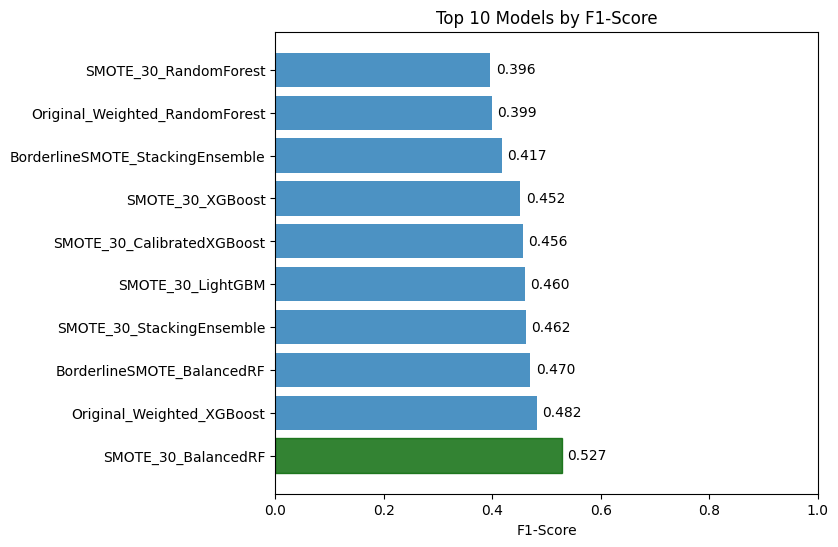

In [91]:
top_10 = results_df.head(10)
y_pos = np.arange(len(top_10))
plt.figure(figsize=(7, 6))
bars = plt.barh(y_pos, top_10['F1-Score'], alpha=0.8)
plt.yticks(y_pos, top_10['Model'])
plt.xlabel('F1-Score')
plt.title('Top 10 Models by F1-Score')
plt.xlim([0, 1])

# Color best model
bars[0].set_color('darkgreen')
for i, bar in enumerate(bars):
    width = bar.get_width()
    plt.text(width + 0.01, bar.get_y() + bar.get_height()/2, f'{width:.3f}', ha='left', va='center')

plt.show()

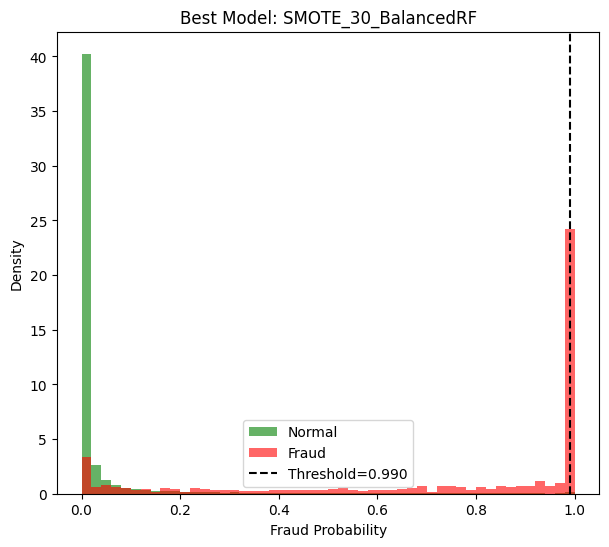

In [92]:
plt.figure(figsize=(7, 6))
best_probs = best_result['probabilities']
fraud_probs = best_probs[y_test == 1]
normal_probs = best_probs[y_test == 0]

plt.hist(normal_probs, bins=50, alpha=0.6, label='Normal', color='green', density=True)
plt.hist(fraud_probs, bins=50, alpha=0.6, label='Fraud', color='red', density=True)
plt.axvline(best_result['threshold'], color='black', linestyle='--', label=f'Threshold={best_result["threshold"]:.3f}')
plt.xlabel('Fraud Probability')
plt.ylabel('Density')
plt.title(f'Best Model: {best_model_name}')
plt.legend()
plt.show()

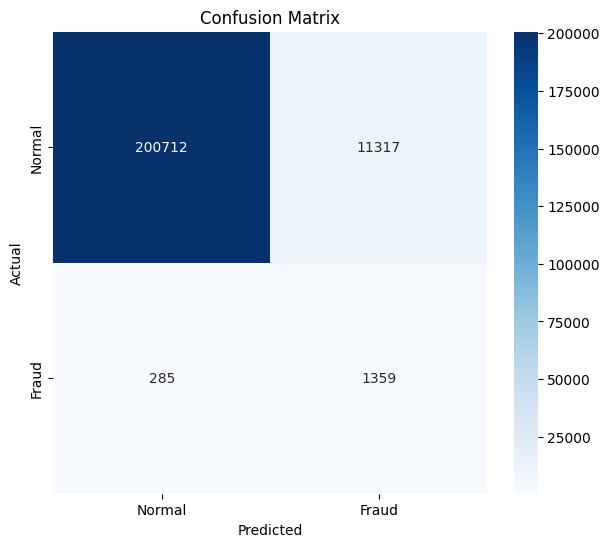

In [93]:
plt.figure(figsize=(7, 6))
y_pred = (best_result['probabilities'] >= 0.25).astype(int)
cm = confusion_matrix(y_test, y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=['Normal', 'Fraud'], yticklabels=['Normal', 'Fraud'])
plt.title('Confusion Matrix')
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.show()

#### Then here i can see that with a threshold of 0.2 we have this confusion matrix :

- 200712 not fraud are well predicted (94.66%)

- 1359 fraud are well predicted (82.66%)

#### Interpretation:

By lowering the threshold to 0.2, the model significantly improves its ability to detect fraudulent cases (high recall on fraud).

However, it also increases the number of false positives (normal transactions flagged as fraud), but this is often acceptable in banking, where the main objective is not to miss real fraud cases—even if it means manually reviewing more alerts.

This strategy maximizes the recall for fraud detection, ensuring that most fraud attempts are caught, even if it leads to a higher rate of false alarms. For banks and financial institutions, minimizing undetected fraud is often a higher priority than avoiding false positives.

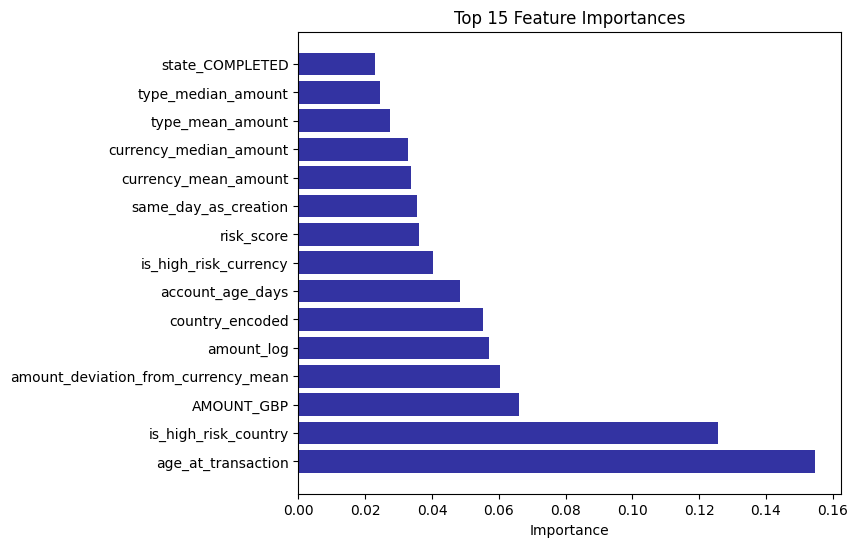

In [94]:
plt.figure(figsize=(7, 6))
if hasattr(best_result['model'], 'feature_importances_'):
    importances = best_result['model'].feature_importances_
    indices = np.argsort(importances)[::-1][:15]
    plt.barh(range(15), importances[indices], alpha=0.8, color='darkblue')
    plt.yticks(range(15), [feature_cols[i] for i in indices])
    plt.xlabel('Importance')
    plt.title('Top 15 Feature Importances')
else:
    plt.text(0.5, 0.5, 'Feature importance not available\nfor this model type', 
             ha='center', va='center', transform=plt.gca().transAxes)
    plt.title('Feature Importance')
plt.show()

In [95]:
# Select sample transactions to demonstrate model predictions
# Get indices of fraud and normal transactions from test set
fraud_idx = y_test[y_test == 1].index
normal_idx = y_test[y_test == 0].index

# Sample 5 fraud cases (or all available if less than 5) and 5 normal cases
sample_idx = np.concatenate([
    np.random.choice(fraud_idx, min(5, len(fraud_idx)), replace=False),  # Sample fraud transactions
    np.random.choice(normal_idx, min(5, len(normal_idx)), replace=False)   # Sample normal transactions
])

In [96]:
if 'Logistic' in best_model_name:
    sample_probs = best_result['model'].predict_proba(
        best_result['scaler'].transform(X_test.loc[sample_idx])
    )[:, 1]
else:
    sample_probs = best_result['model'].predict_proba(X_test.loc[sample_idx])[:, 1]

In [97]:
sample_results = pd.DataFrame({
    'Actual': ['FRAUD' if y else 'NORMAL' for y in y_test.loc[sample_idx]],
    'Probability': sample_probs,
})

In [98]:
print(sample_results.to_string(index=False))

Actual  Probability
 FRAUD         1.00
 FRAUD         1.00
 FRAUD         1.00
 FRAUD         0.52
 FRAUD         1.00
NORMAL         0.04
NORMAL         0.32
NORMAL         0.00
NORMAL         0.00
NORMAL         0.00


In [99]:
probability_of_frauders_mean = sample_results[sample_results['Actual'] == "FRAUD"]['Probability'].mean()
probability_of_normals_mean = sample_results[sample_results['Actual'] == "NORMAL"]['Probability'].mean()

In [100]:
print(f"\nMean Probability of Fraudsters: {probability_of_frauders_mean:.3f}")
print(f"Mean Probability of Normals: {probability_of_normals_mean:.3f}")


Mean Probability of Fraudsters: 0.904
Mean Probability of Normals: 0.072
